In [1]:
import pickle
import shutil
import rasterio
import geopandas
import numpy as np
from os import listdir
from pathlib import Path
import matplotlib.pyplot as plt
from shapely.geometry import shape
import tensorflow as tf
from tensorflow.image import extract_patches
#%matplotlib notebook
%matplotlib inline

2022-05-16 14:31:56.212407: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-05-16 14:31:56.212509: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [20]:
datapath = Path("/shared_volume/zipped")
datapath_unzipped = Path("/shared_volume/unzipped")
datapath_png = Path("/shared_volume/png")
datapath_npy = Path("/shared_volume/npy")

In [3]:
unzipped_data_files = [datapath_unzipped.joinpath(f) for f in listdir(datapath_unzipped) if datapath_unzipped.joinpath(f).exists()]
unzipped_data_files[0:5]

[PosixPath('/shared_volume/unzipped/F16_042071_1227_XI_57S091W.cal.map.tif'),
 PosixPath('/shared_volume/unzipped/F16_042053_2201_XI_40N335W.cal.map.tif'),
 PosixPath('/shared_volume/unzipped/F16_042087_1712_XN_08S177W.cal.map.tif'),
 PosixPath('/shared_volume/unzipped/F16_042056_1556_XI_24S049W.cal.map.tif'),
 PosixPath('/shared_volume/unzipped/F16_042075_1647_XI_15S209W.cal.map.tif')]

## The file

In [17]:
the_file = unzipped_data_files[3]

## Reading the tiff

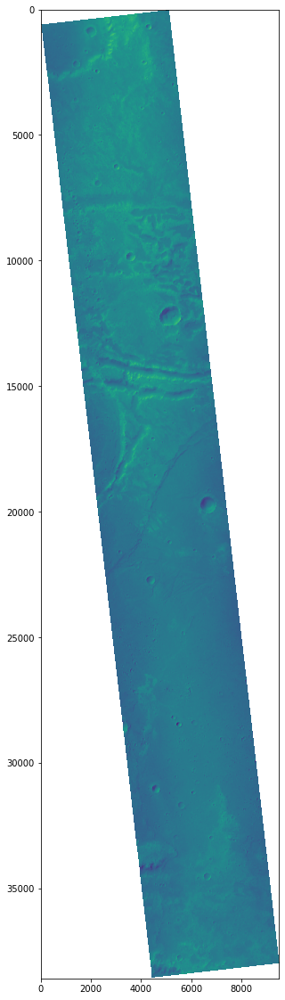

In [4]:
with rasterio.open(the_file) as tif:
    imgg = tif.read(1)
    imgg[imgg<=tif.nodata] = np.nan
    fig, ax = plt.subplots(figsize=(20,20))
    plt.imshow(imgg, cmap = 'viridis')

In [7]:
fig.clf()
plt.close()

In [8]:
imgg.shape

(38589, 9503)

## Extracting sub regions 

In [13]:
def extract_regions(img, region_size, stride):

    print(f"Shape of image: {img.shape}")

    if len(img.shape) == 2:
        img = np.expand_dims(img, axis=0)
        img = np.expand_dims(img, axis=-1)

    print(f"New shape of image: {img.shape}")

    sizes = [1, region_size, region_size, 1]
    depth = img.shape[3]

    patches = extract_patches(images=img,
                    sizes=[1,region_size,region_size,1],
                    strides=[1, stride, stride, 1],
                    rates=[1, 1, 1, 1],
                    padding='VALID')
    
    # (1, 30, 9, 1048576) => (30, 9, 1048576) => (270, 1048576)
    patches = np.squeeze(patches.numpy(), axis=0)
    
    patches = patches.reshape(patches.shape[0]*patches.shape[1], patches.shape[2])
    
    print(f"Region shapes: {patches.shape}")
    
    to_delete = []
    count_ok = 0
    for i, r in enumerate(patches):
        if np.isnan(r).any():
            to_delete.append(i)
        else:
            count_ok += 1
            
    print(f"Not ok: {len(to_delete)}")
    print(f"Ok: {count_ok}")
    
    regions = np.delete(patches, to_delete, axis=0)
    
    print(f"After deletion: {regions.shape}")
    
    return regions

In [14]:
%%time
size = 1024
stride = 1024

regions = extract_regions(imgg, size, stride)

Shape of image: (38589, 9503)
New shape of image: (1, 38589, 9503, 1)


2022-05-16 14:34:42.625994: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1466845068 exceeds 10% of free system memory.


Region shapes: (333, 1048576)
Not ok: 192
Ok: 141
After deletion: (141, 1048576)
CPU times: user 3.27 s, sys: 1.25 s, total: 4.52 s
Wall time: 2.13 s


In [ ]:
#plt.figure(figsize=(12,12))
#plt.imshow(regions[0,5,5,:].reshape(1000,1000,1))

## Showing the subregions

/tmp/ipykernel_709/2587925068.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


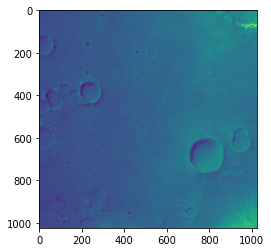

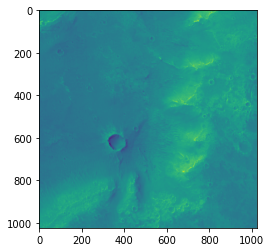

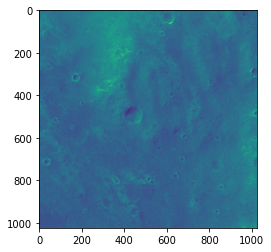

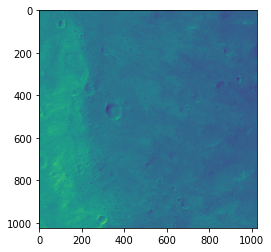

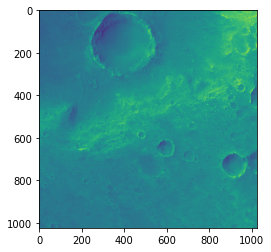

...

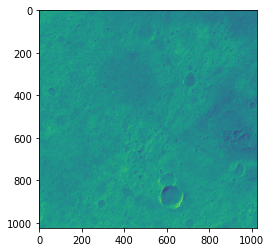

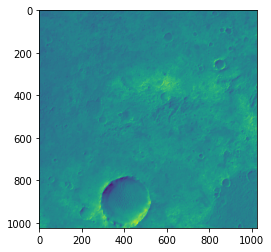

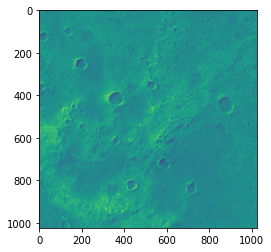

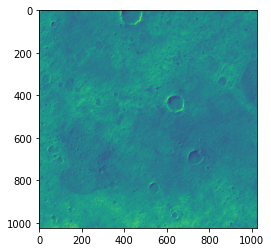

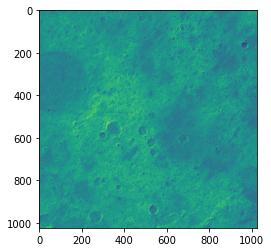

In [15]:
for i, region in enumerate(regions):
    plt.figure()
    ax = plt.subplot()
    ax.imshow(region.reshape(size,size))
    plt.plot()

## Saving the numpy array in binary format

In [21]:
output_file = datapath_npy.joinpath(the_file.stem).with_suffix(".npy")

In [23]:
for i, region in enumerate(regions):
    np.save(output_file, region)